In [1]:
import birankpy
from birank_bias_regularization import *
from birank_reg_utils import *
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import scipy.sparse as spa
from networkx.algorithms import bipartite
import scipy.io
import random
from scipy import stats
%matplotlib inline

np.random.seed(420)

### Toy Model

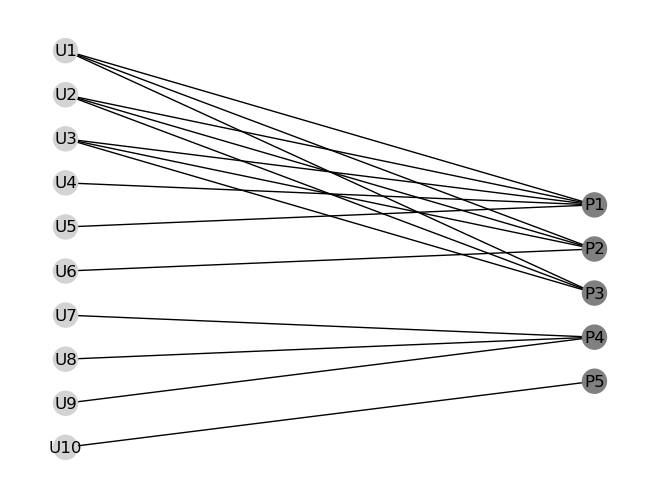

In [2]:
# Define the sets of users and products
users = ['U1', 'U2', 'U3', 'U4', 'U5', 'U6', 'U7', 'U8', 'U9', 'U10']
products = ['P1', 'P2', 'P3', 'P4', 'P5']

# Define the edges between users and products
edges = [
    ('U1', 'P1'), ('U2', 'P1'), ('U3', 'P1'), ('U4', 'P1'), ('U5', 'P1'), # Reviews for P1
    ('U1', 'P2'), ('U2', 'P2'), ('U3', 'P2'), ('U6', 'P2'),  # Reviews for P2
    ('U1', 'P3'), ('U2', 'P3'), ('U3', 'P3'),  # Reviews for P3
    ('U7', 'P4'), ('U8', 'P4'),  ('U9', 'P4'), # Reviews for P4
    ('U10', 'P5')  # Reviews for P5
]

# Create a bipartite graph
B = nx.Graph()
# Add nodes with the node attribute "bipartite"
B.add_nodes_from(users, bipartite=0)  # 0 to indicate one set of nodes
B.add_nodes_from(products, bipartite=1)  # 1 to indicate the other set
# Add edges only between nodes of opposite sets
B.add_edges_from(edges)

# Generate a layout for our nodes 
pos = {}
# Update position for user nodes (inverted index for users to place U1 at the top)
pos.update((node, (1, len(users) - index)) for index, node in enumerate(users))
# Update position for product nodes (centered vertically)
pos.update((node, (2, len(products) - 1 - index + (len(users) - len(products))/2 )) for index, node in enumerate(products))

# Draw the bipartite graph
nx.draw(B, pos, with_labels=True, node_color=['lightgrey' if node in users else 'grey' for node in B])
plt.show()

In [3]:
# Create an empty adjacency matrix
adj_matrix = spa.dok_matrix((len(users), len(products)), dtype=np.int8)

# Populate the adjacency matrix based on the edges
for edge in edges:
    u_idx = users.index(edge[0])
    p_idx = products.index(edge[1])
    adj_matrix[u_idx, p_idx] = 1  # Assuming all reviews are weighted equally

# Convert to a CSR (Compressed Sparse Row) matrix
adj_matrix_csr = adj_matrix.tocsr()

#### Birank normalizer

In [4]:
# Run the BiRank algorithm
# You may need to adjust the parameters like alpha, beta, max_iter based on your specific needs
user_scores, product_scores = birankpy.birank(adj_matrix_csr, normalizer='BiRank',alpha=0.85, beta=0.85, max_iter=20, tol=1e-4)

# user_scores and product_scores are numpy arrays containing the ranking scores of users and products, respectively
user_ranking = np.argsort(-user_scores)  # - for descending order
product_ranking = np.argsort(-product_scores)

# Print top ranked users and products
print("Top ranked users:", [users[i] for i in user_ranking[:5]])  # adjust the slice as needed
print("Top ranked products:", [products[i] for i in product_ranking[:5]])

Top ranked users: ['U10', 'U1', 'U2', 'U3', 'U7']
Top ranked products: ['P1', 'P4', 'P2', 'P5', 'P3']


#### Birank normalizer with user bias regularization

In [5]:
# Run the BiRank algorithm with bias correction
# You may need to adjust the parameters like alpha, beta, max_iter based on your specific needs

# Calculate the degree of each user node
user_activity = {node: B.degree(node) for node in users}

# Convert user_activity dictionary values to a numpy array
user_activity_array = np.array([user_activity[node] for node in users])

# Run the BiRank algorithm with bias correction
user_scores, product_scores = birank_with_regularization(
    adj_matrix_csr, 
    normalizer='BiRank',
    gamma =0.01,
    alpha=0.85, 
    beta=0.85, 
    max_iter=20, 
    tol=1e-4
)

# user_scores and product_scores are numpy arrays containing the ranking scores of users and products, respectively
user_ranking = np.argsort(-user_scores)  # - for descending order
product_ranking = np.argsort(-product_scores)

# Print top ranked users and products
print("Top ranked users:", [users[i] for i in user_ranking[:5]])  # adjust the slice as needed
print("Top ranked products:", [products[i] for i in product_ranking[:5]])

Top ranked users: ['U10', 'U7', 'U8', 'U9', 'U6']
Top ranked products: ['P4', 'P5', 'P1', 'P2', 'P3']


### Synthetic Random Graphs

In our analysis, we first explore the Random Graph model, which parallels the concepts of the Erdős–Rényi approach in network theory. This model is applied to a bipartite graph structure, encompassing two distinct sets – such as users and products – where connections between these sets are formed randomly. Each potential link between a user and a product is established based on a fixed probability, independent of other connections. This randomness in edge formation makes the Random Graph model particularly useful for simulating and understanding networks where interactions are unstructured and follow no predictable pattern. It's a fundamental model for studying the properties of networks in their simplest form, devoid of any preferential biases or structured connectivity patterns.

In [6]:
# Example usage
B_random, users, products = generate_random_bipartite_graph(100, 50, density=0.1)

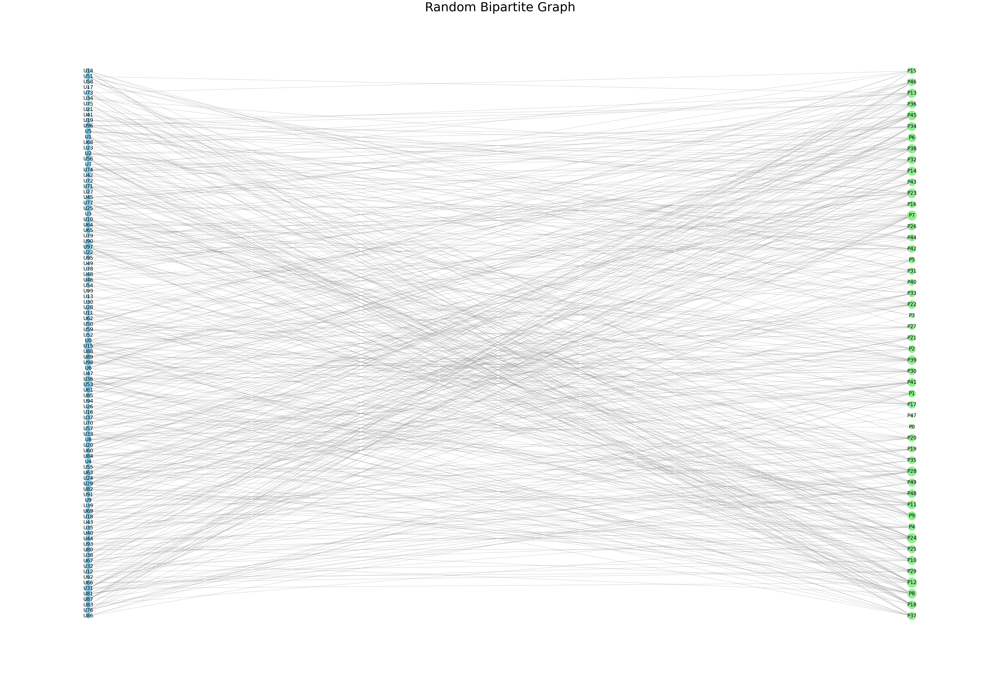

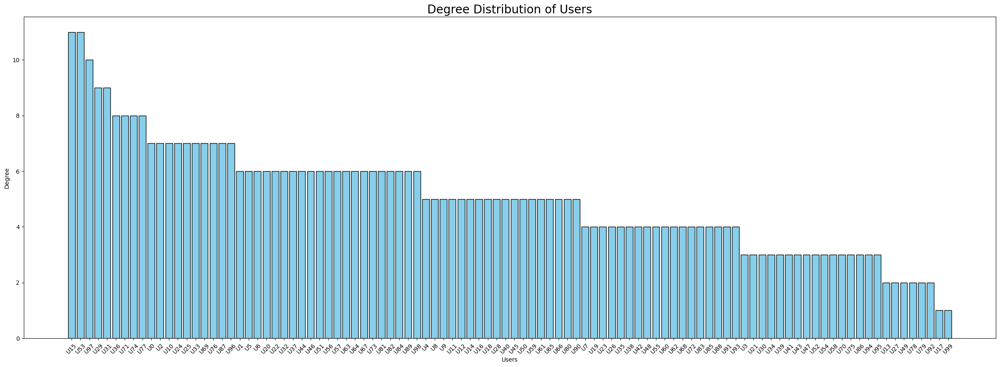

In [7]:
# Plot the random graph
plot_bipartite_graph(B_random, title="Random Bipartite Graph")

# Example usage with the B_random graph and users list
plot_user_degree_distribution(B_random, users)

#### Ranking

In [8]:
# Create an empty adjacency matrix
adj_matrix = spa.dok_matrix((len(users), len(products)), dtype=np.int8)

# Populate the adjacency matrix based on the edges in B_power_law
for u, p in B_random.edges():
    if u in users and p in products:
        u_idx = users.index(u)
        p_idx = products.index(p)
        adj_matrix[u_idx, p_idx] = 1  # Assuming all reviews are weighted equally

# Convert to a CSR (Compressed Sparse Row) matrix
adj_matrix_csr = adj_matrix.tocsr()

In [9]:
# Run the BiRank algorithm
# You may need to adjust the parameters like alpha, beta, max_iter based on your specific needs
user_scores, product_scores = birankpy.birank(adj_matrix_csr, normalizer='BiRank',alpha=0.85, beta=0.85, max_iter=100, tol=1e-4)

# user_scores and product_scores are numpy arrays containing the ranking scores of users and products, respectively
user_ranking = np.argsort(-user_scores)  # - for descending order
product_ranking = np.argsort(-product_scores)

# Print top ranked users and products
print("Top ranked users:", [users[i] for i in user_ranking[:10]])  # adjust the slice as needed
print("Top ranked products:", [products[i] for i in product_ranking[:10]])

Top ranked users: ['U15', 'U53', 'U97', 'U29', 'U31', 'U36', 'U71', 'U74', 'U77', 'U10']
Top ranked products: ['P12', 'P24', 'P7', 'P28', 'P45', 'P23', 'P8', 'P39', 'P13', 'P14']


In [10]:
# Run the BiRank algorithm with bias correction
# You may need to adjust the parameters like alpha, beta, max_iter based on your specific needs

# Run the BiRank algorithm with bias correction
user_scores_reg, product_scores_reg = birank_with_regularization(
    adj_matrix_csr,
    normalizer='BiRank',
    gamma =0.00000000001,
    alpha=0.85,
    beta=0.85,
    max_iter=1000,
    tol=1e-4
)

# user_scores and product_scores are numpy arrays containing the ranking scores of users and products, respectively
user_ranking_reg = np.argsort(-user_scores_reg)  # - for descending order
product_ranking_reg = np.argsort(-product_scores_reg)

# Print top ranked users and products
print("Top ranked users:", [users[i] for i in user_ranking_reg[:10]])  # adjust the slice as needed
print("Top ranked products:", [products[i] for i in product_ranking_reg[:10]])

Top ranked users: ['U99', 'U17', 'U13', 'U92', 'U43', 'U78', 'U49', 'U79', 'U58', 'U27']
Top ranked products: ['P10', 'P39', 'P26', 'P12', 'P7', 'P13', 'P45', 'P28', 'P32', 'P48']


In [11]:
# Disparity
# Calculate the degree of each user node
# Calculate the total degree of the network (sum of degrees of all user nodes)
total_degree = sum(B_random.degree(node) for node in users)

# Compute relative user activity for each user
relative_user_activity = {node: B_random.degree(node) / total_degree for node in users}

# Convert relative_user_activity dictionary values to a numpy array
relative_user_activity_array = np.array([relative_user_activity[node] for node in users])

high_activity_avg_rank, low_activity_avg_rank = calculate_disparity(user_scores, relative_user_activity_array, 0.01)
gini_coefficient_birank = calculate_gini_coefficient(product_scores)

metric_score_birank = fairness_metric(high_activity_avg_rank, low_activity_avg_rank, gini_coefficient_birank)

In [12]:
print("High activity average rank of Birank:", high_activity_avg_rank)
print("Low activity average rank of Birank:", low_activity_avg_rank)
print("Gini Coefficient of Birank:", gini_coefficient_birank)
print("Fairness metric of Birank:", metric_score_birank)

High activity average rank of Birank: 0.013482165174837607
Low activity average rank of Birank: 0.010214426733231486
Gini Coefficient of Birank: 0.07357105949089413
Fairness metric of Birank: 0.11962288113348246


In [13]:
high_activity_avg_rank_reg, low_activity_avg_rank_reg = calculate_disparity(user_scores_reg, relative_user_activity_array, 0.01)
gini_coefficient_reg = calculate_gini_coefficient(product_scores_reg)

metric_score_reg = fairness_metric(high_activity_avg_rank_reg, low_activity_avg_rank_reg, gini_coefficient_reg)

In [14]:
print("High activity average rank of Birank with reg:", high_activity_avg_rank_reg)
print("Low activity average rank of Birank with reg:", low_activity_avg_rank_reg)
print("Gini Coefficient of Birank with reg:", gini_coefficient_reg)
print("Fairness metric of Birank with reg:", metric_score_reg)

High activity average rank of Birank with reg: 0.007828209789322615
Low activity average rank of Birank with reg: 0.011447860140451587
Gini Coefficient of Birank with reg: 6.384687334382021e-10
Fairness metric of Birank with reg: 2.0012706052278288e-06


In [15]:
rank_corr_user = rank_correlation(user_scores, user_scores_reg)
print("Rank Correlation of users between birank and birank with reg:", rank_corr_user)

rank_corr_prod = rank_correlation(product_scores, product_scores_reg)
print("Rank Correlation of products between birank and birank with reg:", rank_corr_prod)

Rank Correlation of users between birank and birank with reg: -0.904074407440744
Rank Correlation of products between birank and birank with reg: 0.7755582232893158


In [16]:
top_n_original, top_n_regularized = top_n_analysis(user_ranking, user_ranking_reg)

# Output results
print("Top N original ranking:", top_n_original)
print("Top N regularized ranking:", top_n_regularized)

Top N original ranking: {97, 36, 71, 74, 10, 77, 15, 53, 29, 31}
Top N regularized ranking: {99, 43, 13, 78, 79, 17, 49, 58, 27, 92}


High activity users: ['U15', 'U53', 'U97', 'U29', 'U31', 'U36', 'U71', 'U74', 'U77', 'U0']


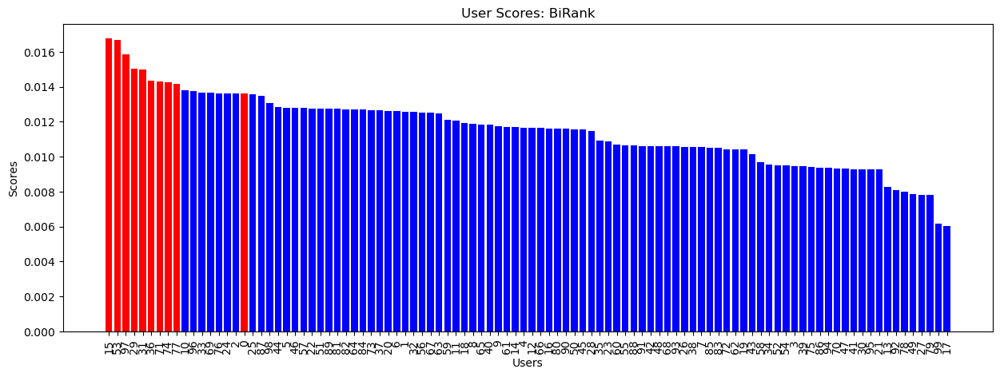

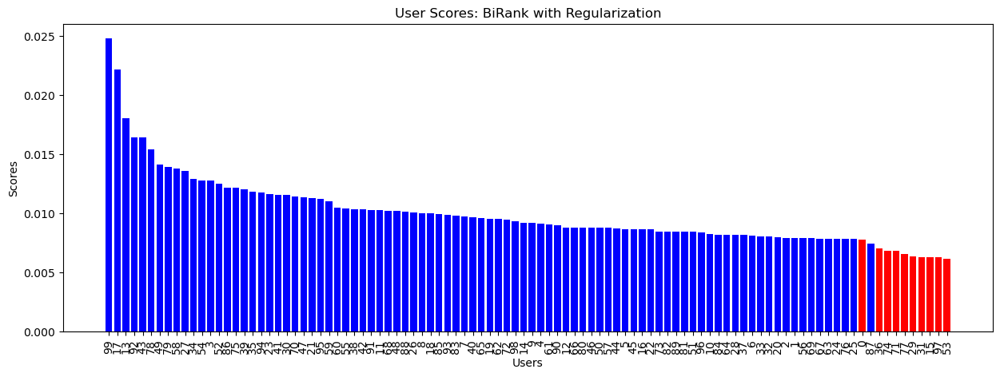

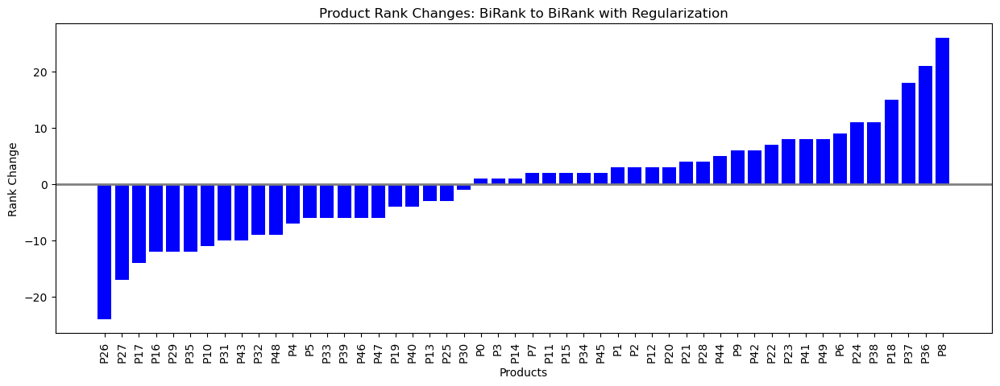

In [17]:
# Identify top 10 high-activity users based on degree
high_activity_users = sorted(relative_user_activity, key=relative_user_activity.get, reverse=True)[:10]

# Check high-activity users
print("High activity users:", high_activity_users)

# Plot user scores for BiRank
plot_user_scores(users, user_scores, high_activity_users, 'User Scores: BiRank')

# Plot user scores for BiRank with Regularization
plot_user_scores(users, user_scores_reg, high_activity_users, 'User Scores: BiRank with Regularization')

# Plot the changes in product ranks
plot_product_rank_changes_ordered(products, product_scores, product_scores_reg, 'Product Rank Changes: BiRank to BiRank with Regularization')

### Power Law

The Power-Law Graph model, which we also employ, is inspired by the Barabási–Albert framework and is adapted to fit the bipartite nature of our network. This model is characterized by the formation of hubs – nodes that have significantly more connections than others, following a power-law distribution. Such a pattern is reflective of a 'rich-get-richer' dynamic, commonly seen in various real-world systems. In the context of our bipartite graphs, this translates to certain users or products becoming highly connected, signifying their dominant role or popularity in the network. The Power-Law Graph model is thus instrumental in understanding and analyzing networks where certain nodes play a pivotal role, influencing the network's structure and dynamics significantly.

In [18]:
# Example usage
B_power_law, users_power_law, products_power_law = generate_power_law_bipartite_graph(100, 50, user_exponent=1.8)

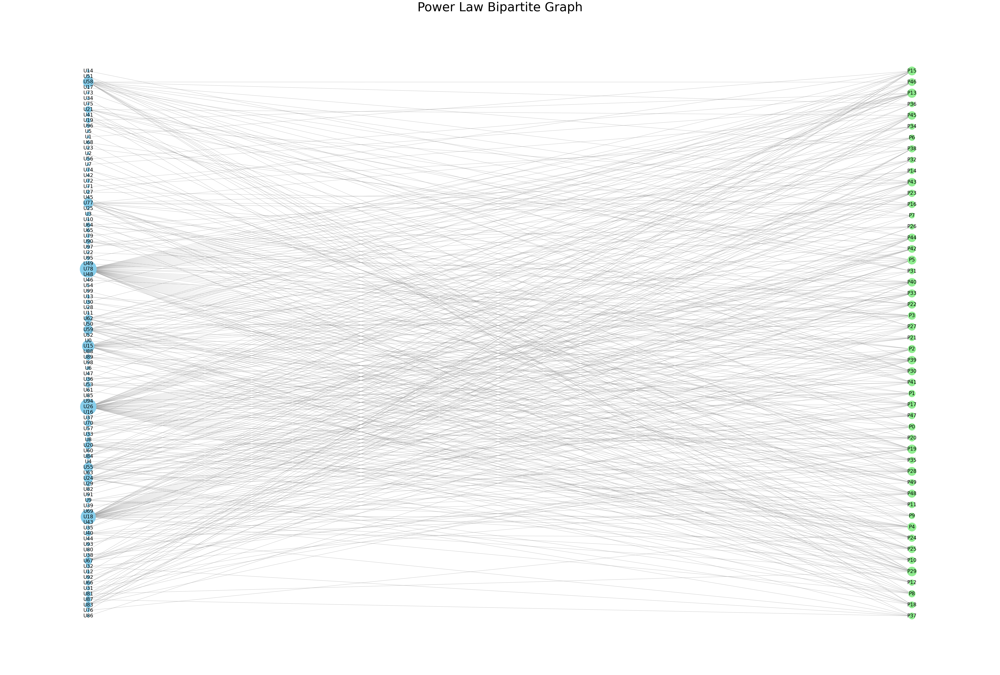

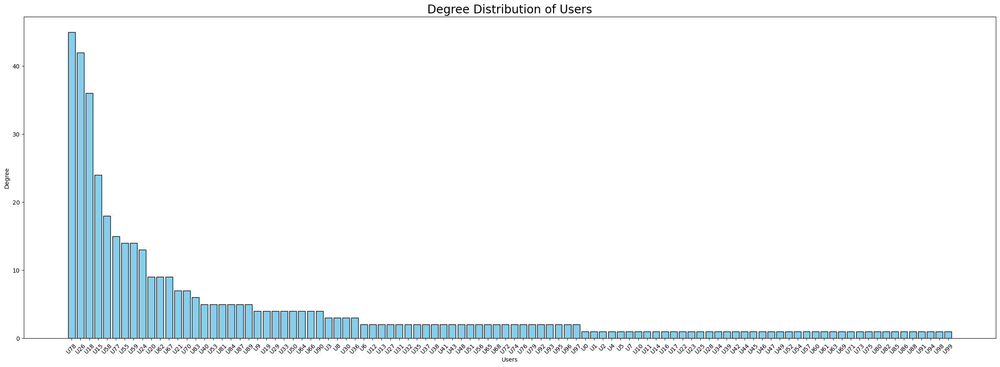

In [19]:
# Plot the random graph
plot_bipartite_graph(B_power_law, title="Power Law Bipartite Graph")

# Example usage with the B_random graph and users list
plot_user_degree_distribution(B_power_law, users_power_law)

In [20]:
# Create an empty adjacency matrix
adj_matrix = spa.dok_matrix((len(users_power_law), len(products_power_law)), dtype=np.int8)

# Populate the adjacency matrix based on the edges in B_power_law
for u, p in B_power_law.edges():
    if u in users_power_law and p in products_power_law:
        u_idx = users_power_law.index(u)
        p_idx = products_power_law.index(p)
        adj_matrix[u_idx, p_idx] = 1  # Assuming all reviews are weighted equally

# Convert to a CSR (Compressed Sparse Row) matrix
adj_matrix_csr = adj_matrix.tocsr()

In [21]:
# Run the BiRank algorithm
# You may need to adjust the parameters like alpha, beta, max_iter based on your specific needs
user_scores, product_scores = birankpy.birank(adj_matrix_csr, normalizer='BiRank',alpha=0.85, beta=0.85, max_iter=1000, tol=1e-4)

# user_scores and product_scores are numpy arrays containing the ranking scores of users and products, respectively
user_ranking = np.argsort(-user_scores)  # - for descending order
product_ranking = np.argsort(-product_scores)

# Print top ranked users and products
print("Top ranked users:", [users_power_law[i] for i in user_ranking[:10]])  # adjust the slice as needed
print("Top ranked products:", [products_power_law[i] for i in product_ranking[:10]])

Top ranked users: ['U78', 'U26', 'U18', 'U15', 'U58', 'U77', 'U59', 'U55', 'U24', 'U62']
Top ranked products: ['P29', 'P13', 'P19', 'P4', 'P15', 'P5', 'P28', 'P40', 'P43', 'P45']


In [22]:
# Run the BiRank algorithm with bias correction
# You may need to adjust the parameters like alpha, beta, max_iter based on your specific needs

# Run the BiRank algorithm with bias correction
user_scores_reg, product_scores_reg = birank_with_regularization(
    adj_matrix_csr,
    normalizer='BiRank',
    gamma =0.0000000000000001,
    alpha=0.85,
    beta=0.85,
    max_iter=1000,
    tol=1e-4
)

# user_scores and product_scores are numpy arrays containing the ranking scores of users and products, respectively
user_ranking_reg = np.argsort(-user_scores_reg)  # - for descending order
product_ranking_reg = np.argsort(-product_scores_reg)

# Print top ranked users and products
print("Top ranked users:", [users_power_law[i] for i in user_ranking_reg[:10]])  # adjust the slice as needed
print("Top ranked products:", [products_power_law[i] for i in product_ranking_reg[:10]])

Top ranked users: ['U7', 'U17', 'U34', 'U75', 'U71', 'U0', 'U4', 'U60', 'U2', 'U44']
Top ranked products: ['P47', 'P13', 'P29', 'P24', 'P11', 'P42', 'P19', 'P15', 'P4', 'P36']


In [23]:
# Disparity
# Calculate the degree of each user node
# Calculate the total degree of the network (sum of degrees of all user nodes)
total_degree = sum(B_power_law.degree(node) for node in users)

# Compute relative user activity for each user
relative_user_activity = {node: B_power_law.degree(node) / total_degree for node in users}

# Convert relative_user_activity dictionary values to a numpy array
relative_user_activity_array = np.array([relative_user_activity[node] for node in users])

high_activity_avg_rank, low_activity_avg_rank = calculate_disparity(user_scores, relative_user_activity_array, 0.1)
gini_coefficient_birank = calculate_gini_coefficient(product_scores)

metric_score_birank = fairness_metric(high_activity_avg_rank, low_activity_avg_rank, gini_coefficient_birank)

In [24]:
print("High activity average rank of Birank:", high_activity_avg_rank)
print("Low activity average rank of Birank:", low_activity_avg_rank)
print("Gini Coefficient of Birank:", gini_coefficient_birank)
print("Fairness metric of Birank:", metric_score_birank)

High activity average rank of Birank: 0.03288239706529313
Low activity average rank of Birank: 0.009363915239477815
Gini Coefficient of Birank: 0.06635240001445235
Fairness metric of Birank: 0.1292906022891477


In [25]:
high_activity_avg_rank_reg, low_activity_avg_rank_reg = calculate_disparity(user_scores_reg, relative_user_activity_array, 0.1)
gini_coefficient_reg = calculate_gini_coefficient(product_scores_reg)

metric_score_reg = fairness_metric(high_activity_avg_rank_reg, low_activity_avg_rank_reg, gini_coefficient_reg)

In [26]:
print("High activity average rank of Birank with reg:", high_activity_avg_rank_reg)
print("Low activity average rank of Birank with reg:", low_activity_avg_rank_reg)
print("Gini Coefficient of Birank with reg:", gini_coefficient_reg)
print("Fairness metric of Birank with reg:", metric_score_reg)

High activity average rank of Birank with reg: 0.0018436425983541745
Low activity average rank of Birank with reg: 0.010082387448501472
Gini Coefficient of Birank with reg: 1.4022116801015727e-14
Fairness metric of Birank with reg: 1.9999975805502305e-06


In [27]:
rank_corr_user = rank_correlation(user_scores, user_scores_reg)
print("Rank Correlation of users between birank and birank with reg:", rank_corr_user)

rank_corr_prod = rank_correlation(product_scores, product_scores_reg)
print("Rank Correlation of products between birank and birank with reg:", rank_corr_prod)

Rank Correlation of users between birank and birank with reg: -0.8318619654913728
Rank Correlation of products between birank and birank with reg: 0.5913707413647257


High activity users: ['U78', 'U26', 'U18', 'U15', 'U58', 'U77', 'U55', 'U59', 'U24', 'U20']


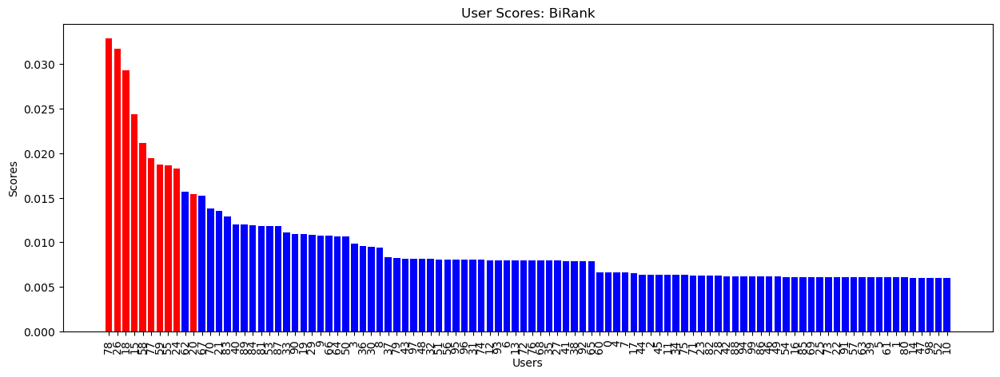

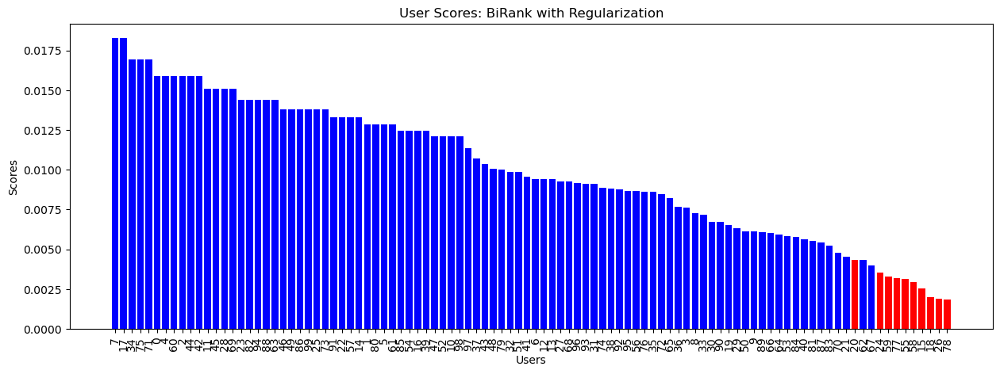

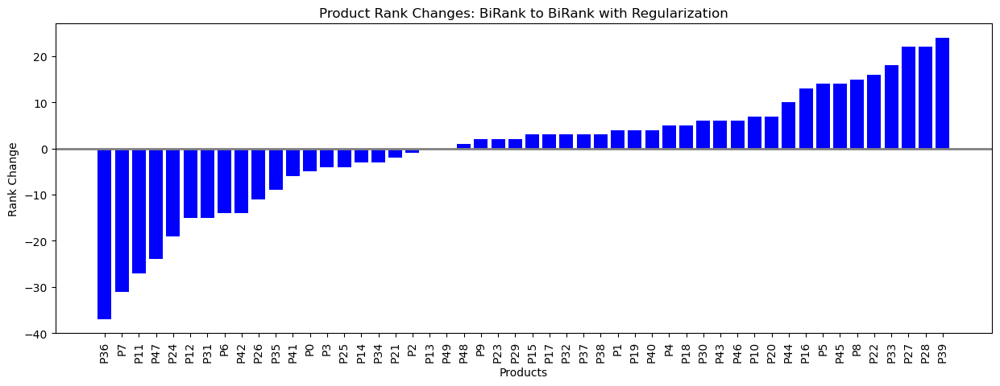

In [28]:
# Identify top 10 high-activity users based on degree
high_activity_users = sorted(relative_user_activity, key=relative_user_activity.get, reverse=True)[:10]

# Check high-activity users
print("High activity users:", high_activity_users)

# Plot user scores for BiRank
plot_user_scores(users, user_scores, high_activity_users, 'User Scores: BiRank')

# Plot user scores for BiRank with Regularization
plot_user_scores(users, user_scores_reg, high_activity_users, 'User Scores: BiRank with Regularization')

# Plot the changes in product ranks
plot_product_rank_changes_ordered(products, product_scores, product_scores_reg, 'Product Rank Changes: BiRank to BiRank with Regularization')